In [1]:
!pip3 install -q xlrd xlwt
!pip3 install -q openpyxl
!pip3 install -q seaborn


In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns


# Make numpy printouts easier to read.
np.set_printoptions(precision=3, suppress=True)

In [3]:
rawDataset = pd.read_excel('vehicle_emission_1.xls', index_col=0)
rawDataset

,SN,Make,Yr,FuelType,VehicleUse,CO,CO2,O2,HC,lamda,Study,OGEPA,Age,VehicleType,EUROII,NESREAI,AFR,NESREAII,EUROIII
N,,,,,,,,,,,,,,,,,,,
1,1,Honda,2006,Petrol,Commercial,0.00,13.5,1.55,0,1.08,Passed,Passed,8,Car,Passed,Passed,15.876,Passed,Passed
2,2,Honda,2007,Petrol,Commercial,0.00,14.7,0.08,10,1.00,Passed,Passed,7,Jeep,Passed,Passed,14.744,Passed,Passed
3,3,Toyota,2011,Petrol,Commercial,0.00,14.6,0.72,1,1.04,Passed,Passed,3,Car,Passed,Passed,15.244,Passed,Passed
4,4,Toyota,1998,Petrol,Official,0.00,10.2,3.15,1,1.22,Passed,Passed,16,Car,Passed,Passed,17.934,Passed,Passed
5,5,Toyota,2002,Petrol,Official,0.00,14.5,0.60,1,1.03,Passed,Passed,12,Car,Passed,Passed,15.141,Passed,Passed
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2761,2796,Toyota,1987,Petrol,Private,4.49,5.8,11.29,603,1.51,Failed,Failed,27,Car,Failed,Failed,22.256,Passed,Failed
2762,2797,Toyota,2007,Petrol,Commercial,4.51,11.9,0.47,388,0.88,Failed,Failed,7,Car,Failed,Failed,12.995,Failed,Failed
2763,2798,Nissan,1984,Petrol,Private,4.51,10.9,1.55,203,0.93,Failed,Failed,30,Car,Failed,Failed,13.700,Failed,Failed


In [4]:
rawDataset.columns

Index(['SN', 'Make', 'Yr', 'FuelType', 'VehicleUse', 'CO', 'CO2', 'O2', 'HC',
       'lamda', 'Study', 'OGEPA', 'Age', 'VehicleType', 'EUROII', 'NESREAI',
       'AFR', 'NESREAII', 'EUROIII'],
      dtype='object')

In [5]:
dataset = rawDataset.copy()
dataset.tail()

,SN,Make,Yr,FuelType,VehicleUse,CO,CO2,O2,HC,lamda,Study,OGEPA,Age,VehicleType,EUROII,NESREAI,AFR,NESREAII,EUROIII
N,,,,,,,,,,,,,,,,,,,
2761,2796,Toyota,1987,Petrol,Private,4.49,5.8,11.29,603,1.51,Failed,Failed,27,Car,Failed,Failed,22.256,Passed,Failed
2762,2797,Toyota,2007,Petrol,Commercial,4.51,11.9,0.47,388,0.88,Failed,Failed,7,Car,Failed,Failed,12.995,Failed,Failed
2763,2798,Nissan,1984,Petrol,Private,4.51,10.9,1.55,203,0.93,Failed,Failed,30,Car,Failed,Failed,13.700,Failed,Failed
2764,2799,Nissan,1986,Petrol,Private,4.55,9.9,3.44,679,1.00,Failed,Failed,28,Car,Failed,Failed,14.627,Failed,Failed
2765,2800,Nissan,1989,Petrol,Official,4.65,8.3,5.61,138,1.13,Failed,Failed,25,Car,Failed,Failed,16.611,Failed,Failed


In [6]:
dataset.isna().sum()

SN             0
Make           0
Yr             0
FuelType       0
VehicleUse     0
CO             0
CO2            0
O2             0
HC             0
lamda          1
Study          0
OGEPA          0
Age            0
VehicleType    0
EUROII         0
NESREAI        0
AFR            0
NESREAII       0
EUROIII        0
dtype: int64

In [7]:
dataset = dataset.dropna()

In [8]:
# prefix = ['Make', 'FuelType', 'VehicleUse', 'Study', 'OGEPA', 'VehicleType', 'EUROII', 'NESREAI', 'NESREAII', 'EUROIII']
boolCols = ['Study', 'OGEPA', 'EUROII', 'NESREAI', 'NESREAII', 'EUROIII']

for col in boolCols:
    dict_colData = { x:i for i,x in enumerate(rawDataset[col].unique())}
    print(dict_colData)
    dataset[col + '_N'] = dataset[col].map(dict_colData)
    
# dataset = pd.get_dummies(dataset, prefix=prefix, prefix_sep='_')
dataset

{'Passed': 0, 'Failed': 1}
{'Passed': 0, 'Failed': 1}
{'Passed': 0, 'Failed': 1}
{'Passed': 0, 'Failed': 1}
{'Passed': 0, 'Failed': 1}
{'Passed': 0, 'Failed': 1}


,SN,Make,Yr,FuelType,VehicleUse,CO,CO2,O2,HC,lamda,...,NESREAI,AFR,NESREAII,EUROIII,Study_N,OGEPA_N,EUROII_N,NESREAI_N,NESREAII_N,EUROIII_N
N,,,,,,,,,,,,,,,,,,,,,
1,1,Honda,2006,Petrol,Commercial,0.00,13.5,1.55,0,1.08,...,Passed,15.876,Passed,Passed,0,0,0,0,0,0
2,2,Honda,2007,Petrol,Commercial,0.00,14.7,0.08,10,1.00,...,Passed,14.744,Passed,Passed,0,0,0,0,0,0
3,3,Toyota,2011,Petrol,Commercial,0.00,14.6,0.72,1,1.04,...,Passed,15.244,Passed,Passed,0,0,0,0,0,0
4,4,Toyota,1998,Petrol,Official,0.00,10.2,3.15,1,1.22,...,Passed,17.934,Passed,Passed,0,0,0,0,0,0
5,5,Toyota,2002,Petrol,Official,0.00,14.5,0.60,1,1.03,...,Passed,15.141,Passed,Passed,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2761,2796,Toyota,1987,Petrol,Private,4.49,5.8,11.29,603,1.51,...,Failed,22.256,Passed,Failed,1,1,1,1,0,1
2762,2797,Toyota,2007,Petrol,Commercial,4.51,11.9,0.47,388,0.88,...,Failed,12.995,Failed,Failed,1,1,1,1,1,1
2763,2798,Nissan,1984,Petrol,Private,4.51,10.9,1.55,203,0.93,...,Failed,13.700,Failed,Failed,1,1,1,1,1,1


In [9]:
dataset = dataset.drop(boolCols, axis=1)

In [10]:
prefix = ['Make', 'FuelType', 'VehicleUse', 'VehicleType']
dataset = pd.get_dummies(dataset, prefix=prefix, prefix_sep='_')
dataset

,SN,Yr,CO,CO2,O2,HC,lamda,Age,AFR,Study_N,...,VehicleUse_Commercial,VehicleUse_Official,VehicleUse_Private,VehicleType_Bullion V,VehicleType_Bus,VehicleType_CABSTAR,VehicleType_Car,VehicleType_Jeep,VehicleType_PICK-UP,VehicleType_TRUCK
N,,,,,,,,,,,,,,,,,,,,,
1,1,2006,0.00,13.5,1.55,0,1.08,8,15.876,0,...,1,0,0,0,0,0,1,0,0,0
2,2,2007,0.00,14.7,0.08,10,1.00,7,14.744,0,...,1,0,0,0,0,0,0,1,0,0
3,3,2011,0.00,14.6,0.72,1,1.04,3,15.244,0,...,1,0,0,0,0,0,1,0,0,0
4,4,1998,0.00,10.2,3.15,1,1.22,16,17.934,0,...,0,1,0,0,0,0,1,0,0,0
5,5,2002,0.00,14.5,0.60,1,1.03,12,15.141,0,...,0,1,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2761,2796,1987,4.49,5.8,11.29,603,1.51,27,22.256,1,...,0,0,1,0,0,0,1,0,0,0
2762,2797,2007,4.51,11.9,0.47,388,0.88,7,12.995,1,...,1,0,0,0,0,0,1,0,0,0
2763,2798,1984,4.51,10.9,1.55,203,0.93,30,13.700,1,...,0,0,1,0,0,0,1,0,0,0


In [11]:
dataset.columns

Index(['SN', 'Yr', 'CO', 'CO2', 'O2', 'HC', 'lamda', 'Age', 'AFR', 'Study_N',
       'OGEPA_N', 'EUROII_N', 'NESREAI_N', 'NESREAII_N', 'EUROIII_N',
       'Make_Honda', 'Make_Mazda', 'Make_Mercedez B', 'Make_Mitsubushi',
       'Make_Nissan', 'Make_Peugeot', 'Make_Toyota', 'Make_Volkswagen',
       'FuelType_Petrol', 'VehicleUse_Commercial', 'VehicleUse_Official',
       'VehicleUse_Private', 'VehicleType_Bullion V', 'VehicleType_Bus',
       'VehicleType_CABSTAR', 'VehicleType_Car', 'VehicleType_Jeep',
       'VehicleType_PICK-UP', 'VehicleType_TRUCK'],
      dtype='object')

In [12]:
favCols = ['CO', 'CO2', 'O2', 'HC', 'Age', 'lamda', 'AFR']

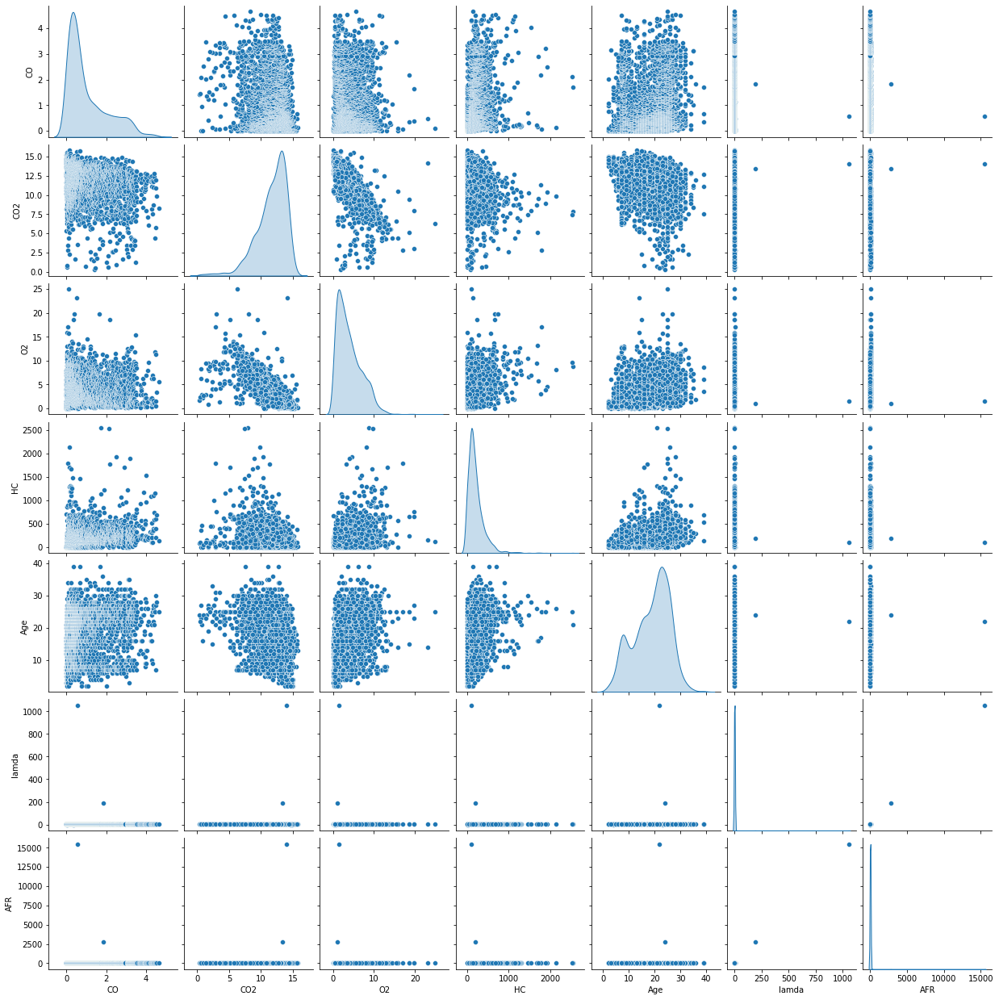

In [13]:
sns.pairplot(dataset[favCols], diag_kind='kde')

In [14]:
dataset.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
SN,2764.0,1415.722865,802.523630,1.000,727.7500,1418.500,2109.2500,2800.00
Yr,2764.0,1995.152315,6.863460,1975.000,1990.0000,1994.000,2000.0000,2012.00
CO,2764.0,1.037435,1.016247,0.000,0.2800,0.610,1.5800,4.65
CO2,2764.0,11.625315,2.363758,0.300,10.4000,12.100,13.4000,15.80
O2,2764.0,3.964012,3.017331,0.020,1.5475,3.210,5.7450,25.00
HC,2764.0,210.441027,217.624778,0.000,94.0000,158.000,273.2500,2547.00
lamda,2764.0,1.680340,20.366994,0.010,1.0400,1.140,1.3200,1055.00
Age,2764.0,18.847685,6.863460,2.000,14.0000,20.000,24.0000,39.00
AFR,2764.0,24.693568,299.394969,0.162,15.2880,16.736,19.4405,15508.50
Study_N,2764.0,0.277496,0.447845,0.000,0.0000,0.000,1.0000,1.00


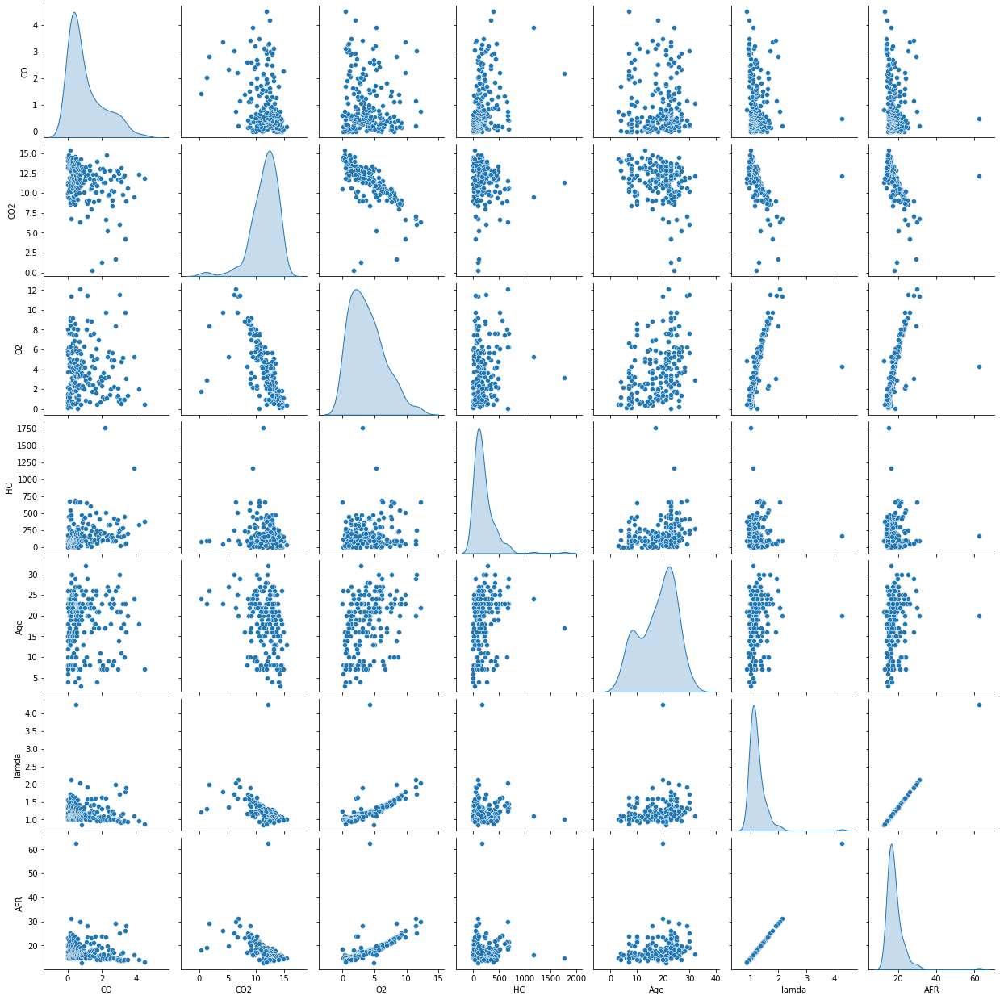

In [15]:
h = 15
X = dataset.copy()
X = X.dropna()
X = X.loc[::h]
sns.pairplot(X[favCols], diag_kind='kde')

In [16]:
X.columns

Index(['SN', 'Yr', 'CO', 'CO2', 'O2', 'HC', 'lamda', 'Age', 'AFR', 'Study_N',
       'OGEPA_N', 'EUROII_N', 'NESREAI_N', 'NESREAII_N', 'EUROIII_N',
       'Make_Honda', 'Make_Mazda', 'Make_Mercedez B', 'Make_Mitsubushi',
       'Make_Nissan', 'Make_Peugeot', 'Make_Toyota', 'Make_Volkswagen',
       'FuelType_Petrol', 'VehicleUse_Commercial', 'VehicleUse_Official',
       'VehicleUse_Private', 'VehicleType_Bullion V', 'VehicleType_Bus',
       'VehicleType_CABSTAR', 'VehicleType_Car', 'VehicleType_Jeep',
       'VehicleType_PICK-UP', 'VehicleType_TRUCK'],
      dtype='object')

In [17]:
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing

print(tf.__version__)

2.4.1


In [18]:
outputCols = ['CO', 'CO2', 'O2', 'HC', 'lamda', 'AFR', 'Study_N',
       'OGEPA_N', 'EUROII_N', 'NESREAI_N', 'NESREAII_N', 'EUROIII_N' ]
outputCols

['CO',
 'CO2',
 'O2',
 'HC',
 'lamda',
 'AFR',
 'Study_N',
 'OGEPA_N',
 'EUROII_N',
 'NESREAI_N',
 'NESREAII_N',
 'EUROIII_N']

In [19]:
inputCols = ['Age', 'Make_Honda', 'Make_Mazda', 'Make_Mercedez B', 'Make_Mitsubushi',
       'Make_Nissan', 'Make_Peugeot', 'Make_Toyota', 'Make_Volkswagen',
       'FuelType_Petrol', 'VehicleUse_Commercial', 'VehicleUse_Official',
       'VehicleUse_Private', 'VehicleType_Bullion V', 'VehicleType_Bus',
       'VehicleType_CABSTAR', 'VehicleType_Car', 'VehicleType_Jeep',
       'VehicleType_PICK-UP', 'VehicleType_TRUCK']

inputCols

['Age',
 'Make_Honda',
 'Make_Mazda',
 'Make_Mercedez B',
 'Make_Mitsubushi',
 'Make_Nissan',
 'Make_Peugeot',
 'Make_Toyota',
 'Make_Volkswagen',
 'FuelType_Petrol',
 'VehicleUse_Commercial',
 'VehicleUse_Official',
 'VehicleUse_Private',
 'VehicleType_Bullion V',
 'VehicleType_Bus',
 'VehicleType_CABSTAR',
 'VehicleType_Car',
 'VehicleType_Jeep',
 'VehicleType_PICK-UP',
 'VehicleType_TRUCK']

In [20]:
train_dataset = X.sample(frac=0.8, random_state=0)
test_dataset = X.drop(train_dataset.index)

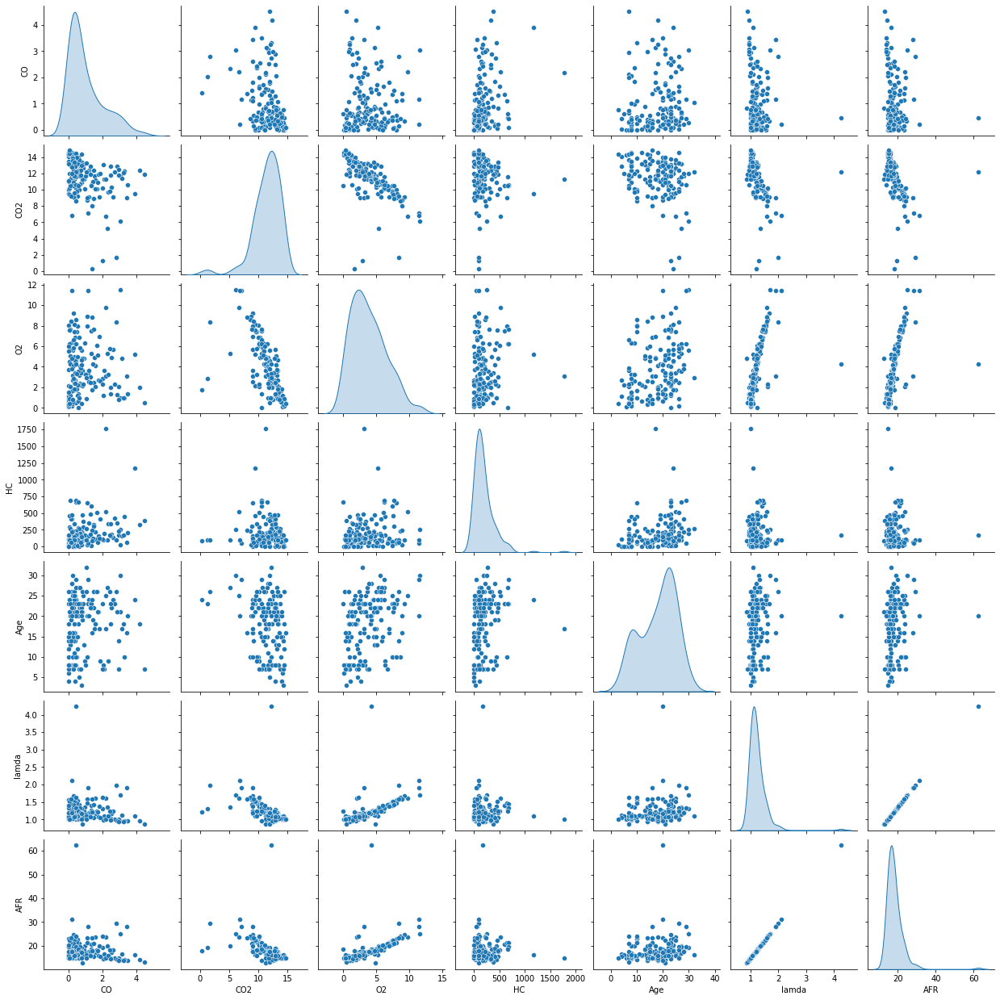

In [21]:
sns.pairplot(train_dataset[favCols], diag_kind='kde')

In [22]:
train_features = train_dataset.copy()
test_features = test_dataset.copy()

train_labels = train_features[outputCols]
test_labels = test_features[outputCols]

train_features = train_features.drop(outputCols, axis=1)
test_features = test_features.drop(outputCols, axis=1)

print(train_features.columns)
print(train_labels.columns)


Index(['SN', 'Yr', 'Age', 'Make_Honda', 'Make_Mazda', 'Make_Mercedez B',
       'Make_Mitsubushi', 'Make_Nissan', 'Make_Peugeot', 'Make_Toyota',
       'Make_Volkswagen', 'FuelType_Petrol', 'VehicleUse_Commercial',
       'VehicleUse_Official', 'VehicleUse_Private', 'VehicleType_Bullion V',
       'VehicleType_Bus', 'VehicleType_CABSTAR', 'VehicleType_Car',
       'VehicleType_Jeep', 'VehicleType_PICK-UP', 'VehicleType_TRUCK'],
      dtype='object')
Index(['CO', 'CO2', 'O2', 'HC', 'lamda', 'AFR', 'Study_N', 'OGEPA_N',
       'EUROII_N', 'NESREAI_N', 'NESREAII_N', 'EUROIII_N'],
      dtype='object')


In [23]:
train_dataset.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
SN,148.0,1392.371622,815.516215,1.000,708.2500,1424.5000,2065.7500,2797.000
Yr,148.0,1995.844595,6.879639,1982.000,1991.0000,1994.0000,2001.0000,2011.000
CO,148.0,1.020135,1.029086,0.000,0.2775,0.6150,1.4875,4.510
CO2,148.0,11.448649,2.406898,0.300,10.3000,11.8500,13.1000,14.800
O2,148.0,3.871149,2.636774,0.020,1.8650,3.3850,5.6325,11.550
HC,148.0,199.648649,221.799255,0.000,86.0000,131.0000,242.5000,1769.000
lamda,148.0,1.238446,0.334909,0.860,1.0675,1.1650,1.3150,4.250
Age,148.0,18.155405,6.879639,3.000,13.0000,20.0000,23.0000,32.000
AFR,148.0,18.200439,4.922006,12.613,15.6920,17.1405,19.3160,62.475
Study_N,148.0,0.283784,0.452364,0.000,0.0000,0.0000,1.0000,1.000


In [24]:
normalizer = preprocessing.Normalization()

In [25]:
normalizer.adapt(np.array(train_features))

In [26]:
print(normalizer.mean.numpy())

[1392.372 1995.845   18.155    0.196    0.061    0.02     0.061    0.284
    0.007    0.358    0.014    1.       0.135    0.128    0.736    0.
    0.074    0.       0.804    0.047    0.068    0.007]


In [27]:
first = np.array(train_features[:1])

with np.printoptions(precision=2, suppress=True):
  print('First example:', first)
  print()
  print('Normalized:', normalizer(first).numpy())

First example: [[ 532 1988   26    0    0    0    0    1    0    0    0    1    0    0
     1    0    0    0    1    0    0    0]]

Normalized: [[-1.06 -1.14  1.14 -0.49 -0.25 -0.14 -0.25  1.59 -0.08 -0.75 -0.12  0.
  -0.4  -0.38  0.6   0.   -0.28  0.    0.49 -0.22 -0.27 -0.08]]


In [28]:
age = np.array(train_features['Age'])

age_normalizer = preprocessing.Normalization(input_shape=[1,])
age_normalizer.adapt(age)

In [29]:
age_model = tf.keras.Sequential([
    age_normalizer,
    layers.Dense(units=1)
])

age_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
normalization_1 (Normalizati (None, 1)                 3         
_________________________________________________________________
dense (Dense)                (None, 1)                 2         
Total params: 5
Trainable params: 2
Non-trainable params: 3
_________________________________________________________________


In [30]:
age_model.predict(age[:10])

array([[-1.444],
       [-1.076],
       [-0.524],
       [-1.26 ],
       [ 0.397],
       [-1.076],
       [ 0.213],
       [ 1.502],
       [ 0.029],
       [-0.708]], dtype=float32)

In [31]:
age_model.compile(
    optimizer=tf.optimizers.Adam(learning_rate=0.1),
    loss='mean_absolute_error')

In [32]:
%%time
history = age_model.fit(
    train_features['Age'], train_labels['CO2'],
    epochs=100,
    # suppress logging
    verbose=0,
    # Calculate validation results on 20% of the training data
    validation_split = 0.2)

CPU times: user 26 s, sys: 3.33 s, total: 29.4 s
Wall time: 49.4 s


In [33]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,val_loss,epoch
95,1.585472,2.025802,95
96,1.591670,2.023237,96
97,1.588249,2.027283,97
98,1.585722,2.026223,98
99,1.586084,2.025580,99


In [34]:
def plot_loss(history, ylabel='Error [Y]'):
    fig, ax = plt.subplots()
    ax.plot(history.history['loss'], label='loss')
    ax.plot(history.history['val_loss'], label='val_loss')
    #   ax.ylim([0, 10])
    ax.set_xlabel('Epoch')
    ax.set_ylabel(ylabel)
    ax.legend()
    ax.grid(True)

    plt.show()

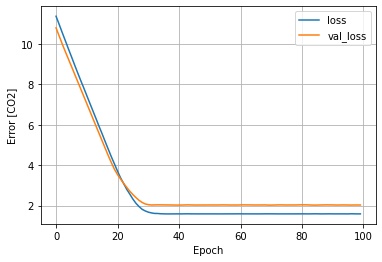

In [35]:
plot_loss(history, f'Error [CO2]')

In [36]:
test_results = {}

test_results['age_model'] = age_model.evaluate(
    test_features['Age'],
    test_labels['CO2'], verbose=0)

In [37]:
x = tf.linspace(0.0, 50, 251)
y = age_model.predict(x)

In [38]:
def plot_age(x, y):
  plt.scatter(train_features['Age'], train_labels['CO2'], label='Data')
  plt.plot(x, y, color='k', label='Predictions')
  plt.xlabel('Age')
  plt.ylabel('CO2')
  plt.legend()

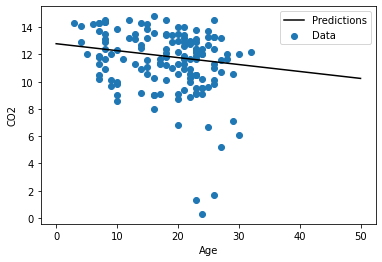

In [39]:
plot_age(x,y)

In [51]:
def plot_prediction(y, yPred, xlabel='True Values [Y]', ylabel='Predictions [Y]', lims=[0, 20]):
    fig, ax = plt.subplots()
    ax = plt.axes(aspect='equal')
    ax.scatter(y, yPred)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    # lims = [0, 20]
    ax.set_xlim(lims)
    ax.set_ylim(lims)
    _ = ax.plot(lims, lims)

In [52]:
def plot_error_hist(error, xlabel, ylabel):
    fig, ax = plt.subplots()
    ax.hist(error, bins=25)
    ax.set_xlabel(xlabel)
    _ = ax.set_ylabel(ylabel)

In [81]:
def get_lim(x,y):
    x1,x2,y1,y2 = (min(x), max(x), min(y), max(y))
    llim = x1
    ulim = x2
    if x1 > y1:
        llim = y1

    if x2 > y2:
        ulim = y2

    (llim,ulim) = (np.floor(llim)-1, np.ceil(ulim)+1)

    h = ((ulim-llim)//3)*2

    llim = llim - h
    ulim = ulim + h

    return [llim, ulim]

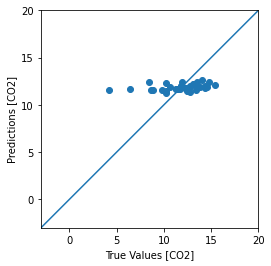

In [82]:
test_predictions = age_model.predict(test_features['Age']).flatten()

x = test_labels['CO2']
y = test_predictions
xlabel = 'True Values [CO2]'
ylabel = 'Predictions [CO2]'

lims = get_lim(x,y)

plot_prediction(x, y, xlabel, ylabel, lims)


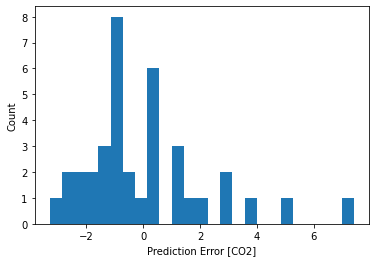

In [54]:
error = test_predictions - test_labels['CO2']
xlabel = 'Prediction Error [CO2]'
ylabel = 'Count'

plot_error_hist(error, xlabel, ylabel)

In [55]:
def plot_model(x, y, sx, sy, xlabel, ylabel):
    fig, ax = plt.subplots()
    ax.scatter(sx, sy, label='Data')
    ax.plot(x, y, color='k', label='Predictions')
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.legend()

    plt.show()

feature_model.summary()
Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
normalization_5 (Normalizati (None, 1)                 3         
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 2         
Total params: 5
Trainable params: 2
Non-trainable params: 3
_________________________________________________________________
None


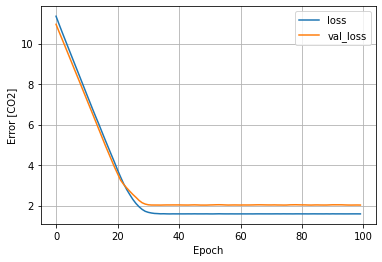

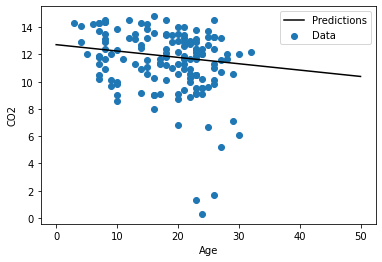

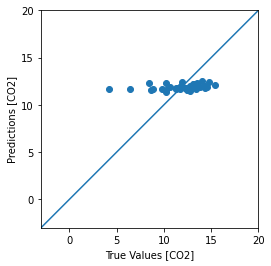

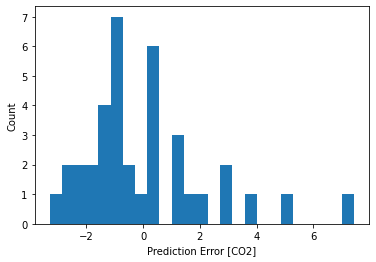

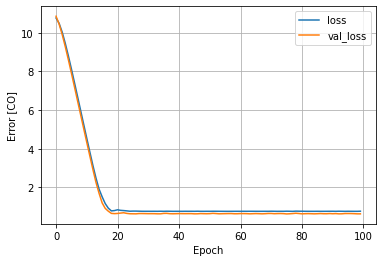

...

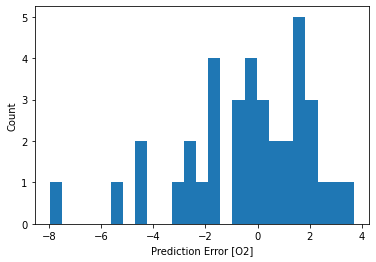

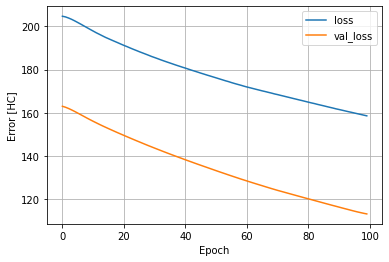

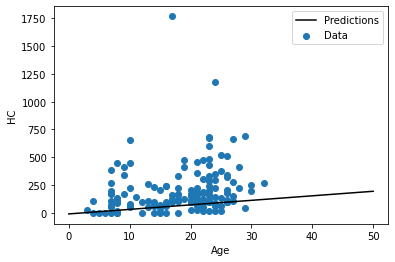

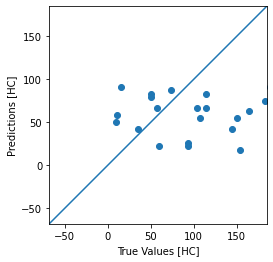

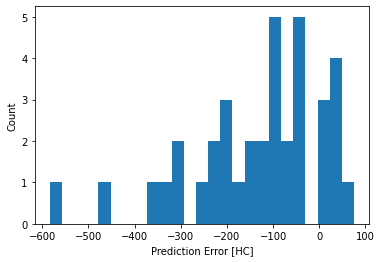

In [83]:

inList = ['Age']
outList = ['CO2', 'CO', 'O2', 'HC']

for i in inList:
    # %%
    feature = np.array(train_features[i])

    feature_normalizer = preprocessing.Normalization(input_shape=[1,])
    feature_normalizer.adapt(feature)


    # %%
    feature_model = tf.keras.Sequential([
        feature_normalizer,
        layers.Dense(units=1)
    ])

    print('feature_model.summary()')
    print(feature_model.summary())


    # %%
    feature_model.predict(age[:10])


    # %%
    feature_model.compile(
        optimizer=tf.optimizers.Adam(learning_rate=0.1),
        loss='mean_absolute_error')

    for o in outList:

        # %%
        history = feature_model.fit(    
            train_features[i], train_labels[o],
            epochs=100,
            # suppress logging
            verbose=0,
            # Calculate validation results on 20% of the training data
            validation_split = 0.2)


        # %%
        hist = pd.DataFrame(history.history)
        hist['epoch'] = history.epoch
        hist.tail()

        # %%
        plot_loss(history, f'Error [{o}]')


        # %%
        test_results[f'{i}_{o}_model'] = feature_model.evaluate(
            test_features[i],
            test_labels[o], verbose=0)


        # %%
        x = tf.linspace(0.0, 50, 251)
        y = feature_model.predict(x)


        # %%
        sx = train_features[i]
        sy = train_labels[o]
        plot_model(x,y, sx, sy, i, o)

        # performance
        test_predictions = feature_model.predict(test_features[i]).flatten()

        x = test_labels[o]
        y = test_predictions
        xlabel = f'True Values [{o}]'
        ylabel = f'Predictions [{o}]'
        
        lims = get_lim(x,y)

        plot_prediction(x, y, xlabel, ylabel, lims)

        # error
        error = test_predictions - test_labels[o]
        xlabel = f'Prediction Error [{o}]'
        ylabel = 'Count'

        plot_error_hist(error, xlabel, ylabel)


In [84]:
test_results

{'age_model': 1.6503167152404785,
 'Age_CO2_model': 1.6547558307647705,
 'Age_CO_model': 0.8362356424331665,
 'Age_O2_model': 1.9167901277542114,
 'Age_HC_model': 148.767822265625}

In [107]:
pd.DataFrame(test_results, index=['Mean absolute error [MPG]']).T

,Mean absolute error [MPG]
age_model,1.650317
Age_CO2_model,1.654756
Age_CO_model,0.836236
Age_O2_model,1.916790
Age_HC_model,148.767822
linear_model,1.739129
dnn_age_model,1.669952


In [85]:
# Multiple inputs


In [86]:
normalizer = preprocessing.Normalization()

normalizer.adapt(np.array(train_features))

In [87]:
linear_model = tf.keras.Sequential([
    normalizer,
    layers.Dense(units=1)
])

In [88]:
linear_model.predict(train_features[:10])

array([[-0.183],
       [ 1.2  ],
       [ 1.139],
       [ 1.205],
       [ 0.033],
       [-0.514],
       [-0.314],
       [-2.761],
       [-1.68 ],
       [ 0.314]], dtype=float32)

In [89]:
linear_model.layers[1].kernel

<tf.Variable 'dense_5/kernel:0' shape=(22, 1) dtype=float32, numpy=
array([[ 0.364],
       [-0.39 ],
       [ 0.241],
       [-0.222],
       [-0.088],
       [ 0.437],
       [-0.226],
       [-0.406],
       [ 0.123],
       [ 0.023],
       [-0.21 ],
       [-0.127],
       [ 0.011],
       [ 0.196],
       [ 0.304],
       [-0.064],
       [ 0.036],
       [-0.508],
       [-0.231],
       [-0.242],
       [ 0.133],
       [-0.056]], dtype=float32)>

In [90]:
linear_model.compile(
    optimizer=tf.optimizers.Adam(learning_rate=0.1),
    loss='mean_absolute_error')

In [91]:
%%time
history = linear_model.fit(
    train_features, train_labels['CO2'], 
    epochs=100,
    # suppress logging
    verbose=0,
    # Calculate validation results on 20% of the training data
    validation_split = 0.2)

CPU times: user 27.7 s, sys: 2.23 s, total: 30 s
Wall time: 34 s


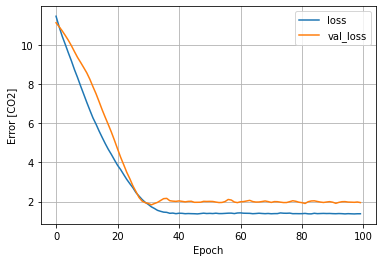

In [92]:
plot_loss(history, 'Error [CO2]')

In [93]:
test_results['linear_model'] = linear_model.evaluate(
    test_features, test_labels['CO2'], verbose=0)

In [94]:
test_results

{'age_model': 1.6503167152404785,
 'Age_CO2_model': 1.6547558307647705,
 'Age_CO_model': 0.8362356424331665,
 'Age_O2_model': 1.9167901277542114,
 'Age_HC_model': 148.767822265625,
 'linear_model': 1.7391289472579956}

In [95]:
# DNN regression

In [96]:
def build_and_compile_model(norm):
    model = keras.Sequential([
      norm,
      layers.Dense(64, activation='relu'),
      layers.Dense(64, activation='relu'),
      layers.Dense(1)
  ])

    model.compile(loss='mean_absolute_error',
                optimizer=tf.keras.optimizers.Adam(0.001))
    return model

In [97]:
dnn_age_model = build_and_compile_model(age_normalizer)

In [98]:
dnn_age_model.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
normalization_1 (Normalizati (None, 1)                 3         
_________________________________________________________________
dense_6 (Dense)              (None, 64)                128       
_________________________________________________________________
dense_7 (Dense)              (None, 64)                4160      
_________________________________________________________________
dense_8 (Dense)              (None, 1)                 65        
Total params: 4,356
Trainable params: 4,353
Non-trainable params: 3
_________________________________________________________________


In [99]:
%%time
history = dnn_age_model.fit(
    train_features['Age'], train_labels['CO2'],
    validation_split=0.2,
    verbose=0, epochs=100)

CPU times: user 29.1 s, sys: 2.08 s, total: 31.2 s
Wall time: 33 s


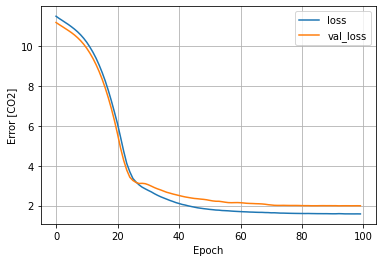

In [100]:
plot_loss(history, 'Error [CO2]')

In [101]:
x = tf.linspace(0.0, 50, 251)
y = dnn_age_model.predict(x)

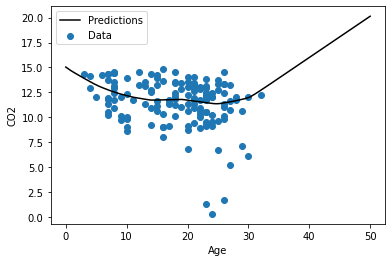

In [102]:
plot_age(x, y)

In [103]:
test_results['dnn_age_model'] = dnn_age_model.evaluate(
    test_features['Age'], test_labels['CO2'],
    verbose=0)

In [104]:
test_results

{'age_model': 1.6503167152404785,
 'Age_CO2_model': 1.6547558307647705,
 'Age_CO_model': 0.8362356424331665,
 'Age_O2_model': 1.9167901277542114,
 'Age_HC_model': 148.767822265625,
 'linear_model': 1.7391289472579956,
 'dnn_age_model': 1.6699517965316772}

In [105]:
dnn_model = build_and_compile_model(normalizer)
dnn_model.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
normalization_6 (Normalizati (None, 22)                45        
_________________________________________________________________
dense_9 (Dense)              (None, 64)                1472      
_________________________________________________________________
dense_10 (Dense)             (None, 64)                4160      
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 65        
Total params: 5,742
Trainable params: 5,697
Non-trainable params: 45
_________________________________________________________________


In [106]:
%%time
history = dnn_model.fit(
    train_features, train_labels['CO2'],
    validation_split=0.2,
    verbose=0, epochs=100)

CPU times: user 1min 4s, sys: 5.48 s, total: 1min 10s
Wall time: 3min 28s


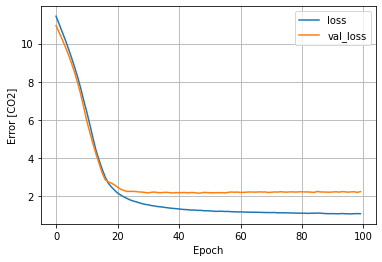

In [108]:
plot_loss(history, 'Error [CO2]')

In [109]:
test_results['dnn_model'] = dnn_model.evaluate(test_features, test_labels, verbose=0)

In [110]:
pd.DataFrame(test_results, index=['Mean absolute error [CO2]']).T

,Mean absolute error [CO2]
age_model,1.650317
Age_CO2_model,1.654756
Age_CO_model,0.836236
Age_O2_model,1.916790
Age_HC_model,148.767822
linear_model,1.739129
dnn_age_model,1.669952
dnn_model,24.152624


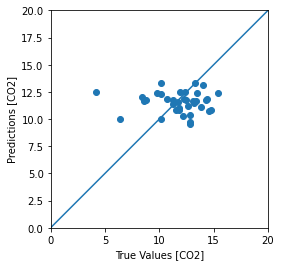

In [111]:
test_predictions = dnn_model.predict(test_features).flatten()

a = plt.axes(aspect='equal')
plt.scatter(test_labels['CO2'], test_predictions)
plt.xlabel('True Values [CO2]')
plt.ylabel('Predictions [CO2]')
lims = [0, 20]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)


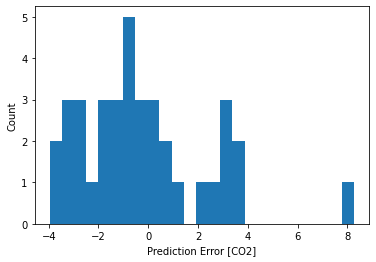

In [112]:
error = test_predictions - test_labels['CO2']
plt.hist(error, bins=25)
plt.xlabel('Prediction Error [CO2]')
_ = plt.ylabel('Count')

In [113]:
dnn_model.save('dnn_model')

INFO:tensorflow:Assets written to: dnn_model/assets


In [114]:
reloaded = tf.keras.models.load_model('dnn_model')

test_results['reloaded'] = reloaded.evaluate(test_features, test_labels['CO2'], verbose=0)

In [115]:
pd.DataFrame(test_results, index=['Mean absolute error [CO2]']).T

,Mean absolute error [CO2]
age_model,1.650317
Age_CO2_model,1.654756
Age_CO_model,0.836236
Age_O2_model,1.916790
Age_HC_model,148.767822
linear_model,1.739129
dnn_age_model,1.669952
dnn_model,24.152624
reloaded,1.977535
